<h1><center>Proyecto Final PDS</center></h1>
<h2><center>Juan Camilo Chaparro Castellanos</center></h2>
<h3><center>CC 1039466438</center></h3>

## En este proyecto se pretende filtrar una señal de audio sobre un instrumento musical utilizando diferentes filtros digitales para poder analizar la señal original vs la señal filtrada, poder analizar cambios en el dominio del tiempo y en el dominio de la frecuencia de la señal filtrada y analizar los diferentes comportamientos de la siguiente manera: 

1. Buscar una señal de audio de un instrumento musical
2. Hacer un análisis en frecuencia (FFT, espectrograma) que muestre los rangos de frecuencias en los que se distribuye la señal
3. Realizar los cálculos teóricos del diseño de los filtros (apoyarse en Python para el cálculo de los coeficientes del filtro). Utilizar diferentes filtros (mínimo 3) para que obtengan diferentes tonos de la señal de audio
4. Comparar la señal original y la señal filtrada y observar sus diferencias (visualmente y mediante la correlación)
5. Realizar el filtrado usando las funciones ya definidas en Python (esto lo verán en el último laboratorio)
6. Comparar el diseño teórico y el diseño con las funciones en Python de los diferentes filtros (Utilizar la correlación para comparar las señales).
7. La sustentación se hará en la semana de habilitaciones (11 al 14 de junio). Ya les enviaré los respectivos días y horarios para cada grupo. Si algún grupo quiere sustentar antes, me lo hacen saber para coordinar el espacio.

In [31]:
#librerias a utilizar

from matplotlib.pylab import *
import scipy.signal as signal
get_ipython().run_line_magic('matplotlib', 'inline')
import math #Librería matemática  
import numpy as np #Librería matemática y de vectores y matrices
import scipy.signal as sp #Librería para procesamiento de señales 
import matplotlib.pyplot as plt #Para graficar
import pandas as pd
import scipy.io.wavfile as waves #Para cargar los audios en formato wav 
from IPython.display import Audio #Para escuchar los audios
from scipy.io.wavfile import read, write #funciones para leer y escribir audio
from scipy.io.wavfile import read
from IPython.display import Audio
from scipy.signal import kaiserord, lfilter, firwin, freqz
%matplotlib inline

### A continuacion realizaremos la carga de audio y el debido proceso para graficarlo y escucharlo

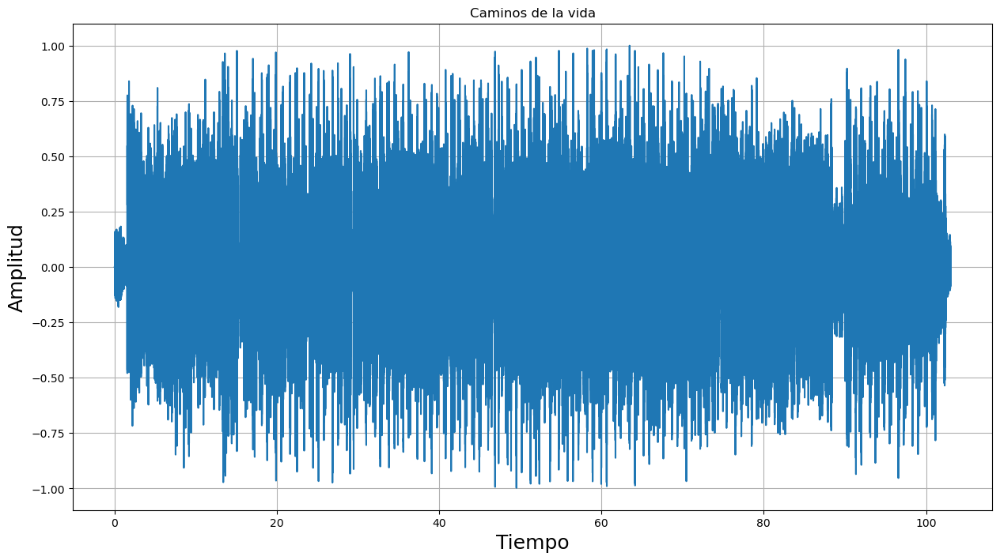

In [45]:
# Cargar el archivo de audio
fs, x = read('audio.wav')  # Carga del audio descargado.

# Verificar y manejar si los datos son estéreo (2 canales)
  #En caso de ser estereo, trabajarlo como (mono)
if len(x.shape) > 1:
    x = x[:, 0]  # Usar solo el primer canal si el audio es estéreo
    
# Normalizar la señal
 #Se normaliza la señal para evitar la saturacion, trabajar sobre un rango especifico, facilitar el analisis
x = x / float(np.max(np.abs(x))) 
# Eliminar nivel DC
 #Centrar la señal en el eje cero, elimina distorciones(zumbidos, estatica) no deseadas y para la T. de F. 
nivel_DC = np.mean(x)
x -= nivel_DC

# Crear el vector de tiempo
 #para mapear el tiempo del audio para su postumo analisis
t = np.arange(0, float(len(x)) / fs, 1.0 / fs)  

# Gráfica de la señal
plt.figure(figsize=(15, 8))
plt.plot(t, x)
plt.grid()
plt.title('Caminos de la vida')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.show()

# Reproducir el audio
 #Widget de Notebook para reproducir del audio
display(Audio(x, rate=fs))


#### para poder realizar el analisis del audio y su filtrado se tiene una gran limitacion que es el espacio de memoria del ordenador por lo que es necesario solo utilizar una fraccion del audio, para ello seleccionamos un tramos de 6 segundos como se muestra a continuacion

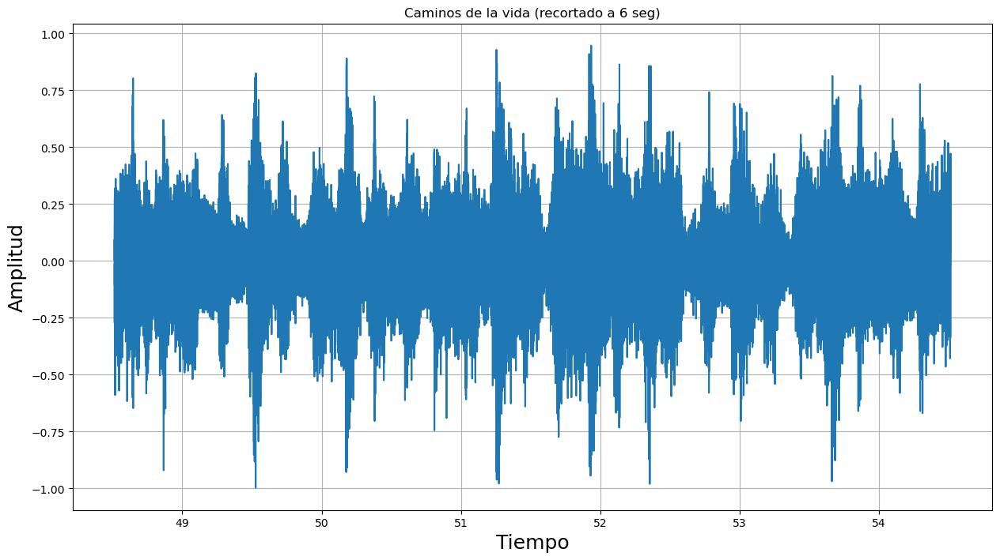

In [47]:
duracion_total = len(x) / fs # Duración total del audio en segundos
duracion_segmento = 6 # Duración del segmento a recortar (6 segundos)
muestras_segmento = int(duracion_segmento * fs) # Número de muestras para poder representar el segmento de 6 segundos

# Inicio del segmento
inicio = int((duracion_total - duracion_segmento) / 2 * fs)

# Final del segmento
fin = inicio + muestras_segmento

# Segmento de audio recortado
audio_recortado = x[inicio:fin]

# Gráfica de la señal recortada
plt.figure(figsize=(15, 8))
plt.plot(t[inicio:fin], audio_recortado)
plt.grid()
plt.title('Caminos de la vida (recortado a 6 seg)')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.show()

# Reproducir el audio recortado
display(Audio(audio_recortado, rate=fs))

### Realizamos el respectivo analisis en frecuencia (FFT y Espectograma)

Se realiza el analisis de la transformada reapida de fourier (FFT), el cual es un algoritmo de calculo de la transformada discreta de fourier que elimina los calculos repetitivos y permite mayor precision disminuyendo los errores de redondeo y se expresa de la siguiente manera: 

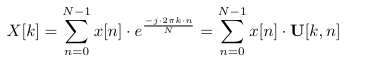

Donde U ∈ R^(N×K) representa una matriz de transformacion, Donde N es el nuumero de muestras de la señnal, y NFFT es el numero de puntos de la Transformada de Fourier que se desea calcular

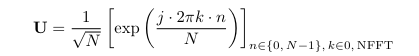

Dicho numero de puntos define la resolucion en frecuencia, donde cada uno mapea el contenido de frecuencia de la señal en un rango normalizado entre 0 y 2*pi*rad/seg, por lo que definimos dicha matriz de mapeo de la siguiente manera: 


In [6]:
def dftmatrix(N, Nfft):
    #construct DFT matrix
    k= np.arange(Nfft)
    if N is None: N = Nfft
    n = np.arange(N)
    U = np.matrix(np.exp(1j* 2*np.pi/Nfft *k*n[:,None]))
    return U/np.sqrt(Nfft)

y posteriormente se realiza la multiplicacion de la matriz con la señal, para poder realizar la operacion las muestras de l audio se deben reorganizar como una columna (un vector de una dimension): 

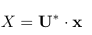

#### como se anuncio anteriormente por limitacion de memoria para el analisis, se toma solo 512 puntos para definir la resolucion en frecuencia de la señal

In [48]:
nfft=512 #puntos de resolucion
audio_recortado.shape=(len(audio_recortado),1) # Convierto en vector columna la señal
U=dftmatrix(len(audio_recortado), nfft) #matriz de transformacion
Xf=U.H*audio_recortado[:] # calculo la fft
t = np.arange(0, float(len(audio_recortado)) / fs, 1.0 / fs)  
freq=np.hstack((np.arange(0, nfft/2-1), np.arange(-nfft/2, 1)))*fs/nfft # vector de frecuencias


frecuencia de muestreo:  44100 Hz
numero de muestras:  264600


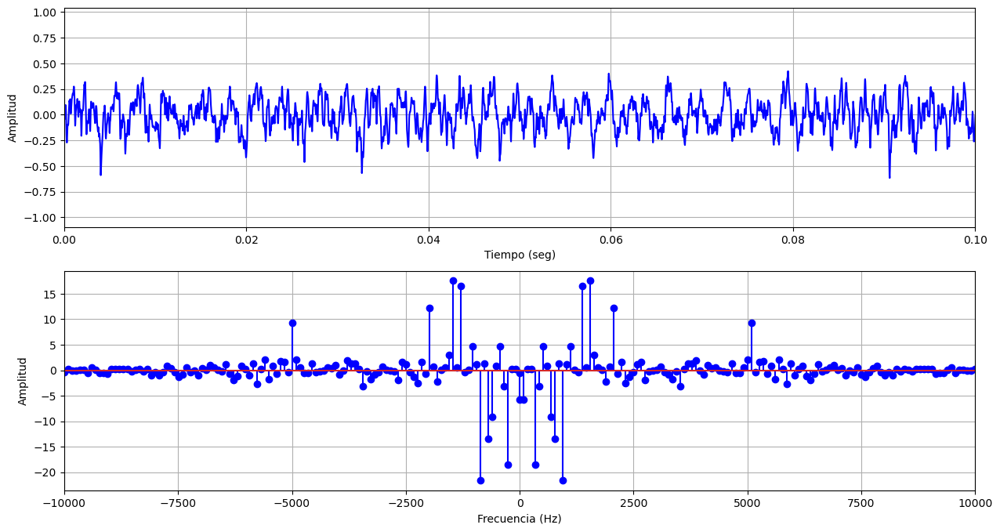

In [49]:
plt.figure(figsize=(15,8))
plt.subplot(211)
plt.plot(t, audio_recortado,'b')
plt.xlim(0,0.1) 
plt.ylabel('Amplitud')
plt.xlabel('Tiempo (seg)')
plt.grid()
plt.subplot(212)
plt.stem(freq, Xf,'b')
plt.ylabel('Amplitud')
plt.xlabel('Frecuencia (Hz)')
plt.xlim(-10000,10000)
plt.grid()
#data
print ('frecuencia de muestreo: ',fs,'Hz')
print('numero de muestras: ',len(audio_recortado))

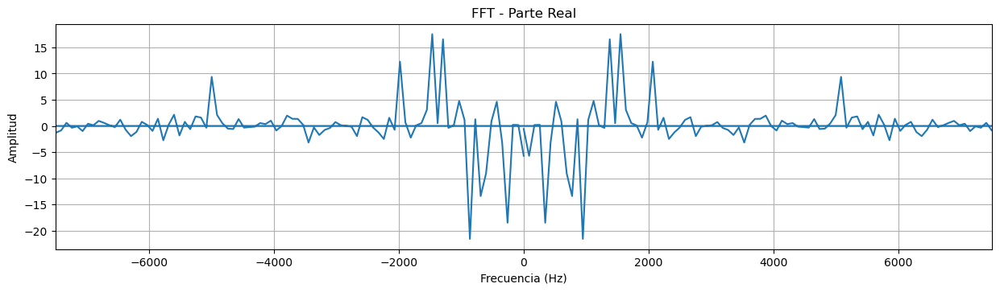

In [50]:
plt.figure(figsize=(15,8))
# Graficar la parte real
plt.subplot(2, 1, 1)
plt.plot(freq, np.real(Xf))
plt.title('FFT - Parte Real')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim(-7500,7500)
plt.grid()

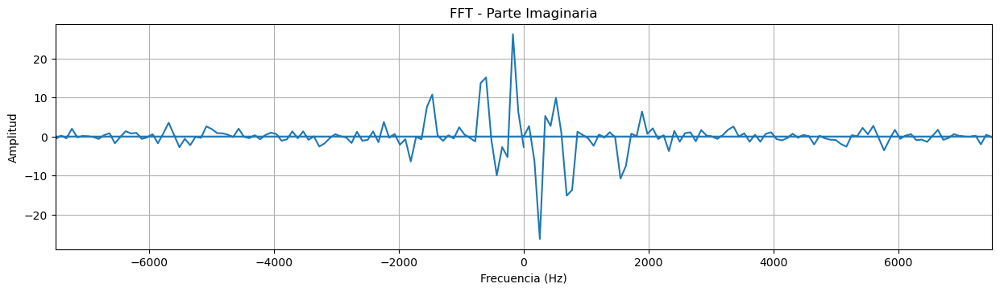

In [51]:
plt.figure(figsize=(15,8))
# Graficar la parte imaginaria
plt.subplot(2, 1, 2)
plt.plot(freq, np.imag(Xf))
plt.title('FFT - Parte Imaginaria')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim(-7500,7500)
plt.grid()

#### * La parte real posee un comportamiento de simetria par respector al eje vertical
#### * En la grafica de la parte imaginaria muestra como las diferentes frecuencias contribuyen con la fase de la señal 
#### * Esta grafica muestra que el rango de las frecuencias del audio se encuentran alrrededor de las 7.5Khz

ahora procedemos a realizar el espectograma

In [52]:
def potspec(X, size, n_padded_min=0):
    # Zero padding
    if n_padded_min==0:
        n_padded = max(n_padded_min, int(2 ** np.ceil(np.log(size) / np.log(2))))
    else:
        n_padded = n_padded_min
    # Transformada de Fourier
    Y = np.fft.fft(X, n=n_padded)
    Y = np.absolute(Y)
    # non-redundant part
    m = int(n_padded / 2) + 1
    Y = Y[:, :m]
    Img=Y.imag
    Real=Y.real
    spec= np.sqrt(Real**2+ Img**2)

    return spec, n_padded

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


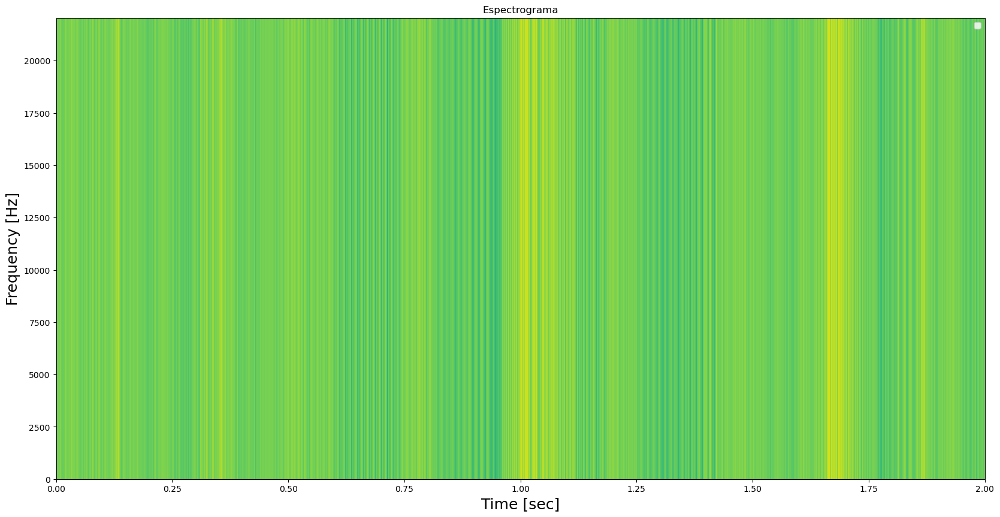

In [53]:
espectro,nfft=potspec(np.vstack(audio_recortado),size,512)
espectro=np.flipud(10*np.log10(espectro).T)
plt.figure(figsize=(20,10))
plt.title('Espectrograma')
plt.imshow(espectro,aspect='auto', extent=[0, len(audio_recortado)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize=18)
plt.xlabel('Time [sec]', fontsize=18)
plt.legend()
plt.xlim(0,2)
plt.show()

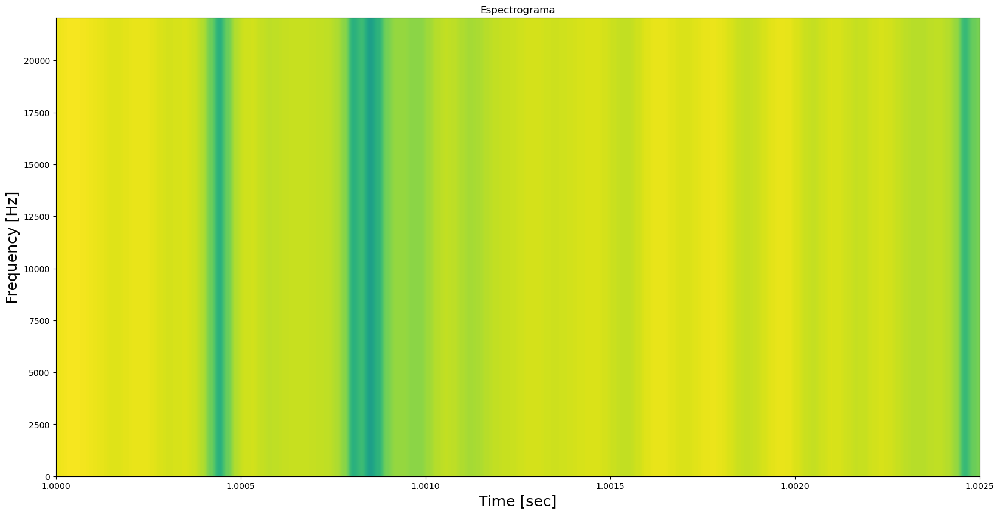

In [54]:
espectro,nfft=potspec(np.vstack(audio_recortado),size,512)
espectro=np.flipud(10*np.log10(espectro).T)
plt.figure(figsize=(20,10))
plt.title('Espectrograma')
plt.imshow(espectro,aspect='auto', extent=[0, len(audio_recortado)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize=18)
plt.xlabel('Time [sec]', fontsize=18)
plt.xlim(1,1.0025)
plt.show()

podemos observar que la señal presenta una gran intensidad en la mayoria del espectro de frecuencia, presentandose hasta los 22KHZ con una intensidad alrrededor de los -80 dB (amarillo y verde), mientras que una intensidad mayor de los -100 db (azul o morada) no se evidencia mucho

# Diseño de Filtros (teoricos)

Para el desarrollo del enventanado tomamos como referencia la siguiente tabla :  que se tiene a continuacion : 
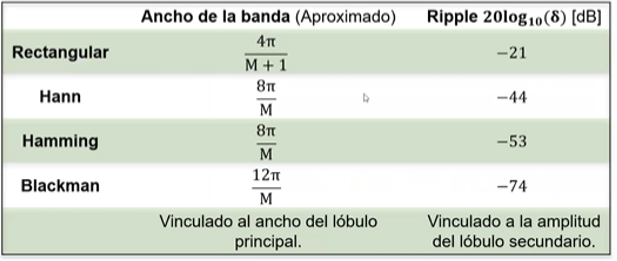
<center> Figura #1, tabla de ventanas </center>

## * 1er Filtro

Se diseña de un **Filtro Pasa-Bajos**  por medio de la tecnica del enventanado teniendo en cuenta las siguientes caracteristicas: 
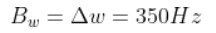
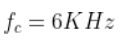


por lo que realizamos el siguiente analisis : 
Se tiene que el ripple esta representado con el simbolo delta 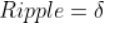 y expresado en porcentaje por lo que tiene que su valor es 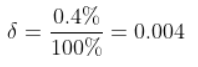  y debemos hallar su valor expresado en dB
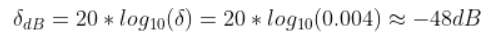
Luego comparamos el valor hallado con la tabla de valores de la **Figura #1** y de esta manera seleccionamos cual es la tecnica de enventanado mas propicio para filtrar la señal; realizando la comparacion se obtiene que solo podemos aplicar 2 enventanados (Hamming y BlackMan) por lo que realizamos el analisis para seleccionar cual es la mejor opcion de la siguiente manera : 
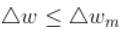
Hamming :
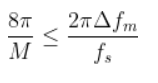
por lo que se obtiene que el orden del filtro es el siguiente:
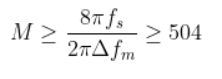, pero para que el filtro pueda tener fase lineal al generarlo de forma causal y simetria par es necesario que : 
mientras que con BlackMan: 
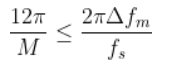
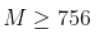
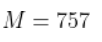

Por consiguiente se toma en consideracion la ventana Hamming ya que al ser de menor orden el filtro, por optimizacion de recursos de memoria del ordenador

se procede a normalizar la frecuencia de corte y la frecuencia angular
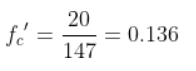
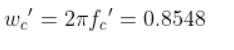
procedemos a utilizar las ecuaciones que representan la respuesta al impulso de un filtro pasa bajas y el enventanado Hamming respectivamente
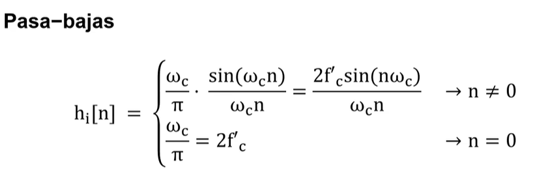
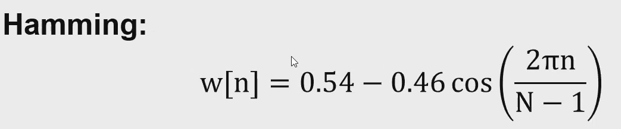
procedemos a realizar las operaciones matematicas para hallar los coeficientes del filtro

In [56]:
#Valores que definen el filtro
fs=44100.0
BW = 350.0 #ancho de banda
bwn=2*np.pi*(BW/fs) #ancho de banda normalizada
fc= 6000.0 #frecuencia de corte
fc_norm= fc/ fs # frecuencia de corte normalizada
wc = 2*np.pi*(fc/fs) # frecuencia angular normalizada
delta = 0.004 #ripple
delta_dB = -48 #ripple en dB
M = 505 #orden del filtro

n = np.arange(-M // 2 + 1, M // 2 + 1)

# Generamos la ecuación del filtro
hi_n = 2 * fc_norm * (sin(wc * n) / (wc * n))
hi_n[n==0] = 2 * fc_norm


# Generamos la ecuacion del enventanado
wn = np.array([0.54 - 0.46 * np.cos(2 * np.pi * n / (M - 1)) for n in range(M)])


#filtro final enventanado
H_n = hi_n * wn

C:\Users\Usuario\AppData\Local\Temp\ipykernel_2920\915121586.py:15: RuntimeWarning: invalid value encountered in divide
  hi_n = 2 * fc_norm * (sin(wc * n) / (wc * n))


#### A conitnuacion imprimimos todos los vectores 

In [356]:
print("el vector de orden de las muestras n= ", n)

el vector de orden de las muestras n=  [-252 -251 -250 -249 -248 -247 -246 -245 -244 -243 -242 -241 -240 -239
 -238 -237 -236 -235 -234 -233 -232 -231 -230 -229 -228 -227 -226 -225
 -224 -223 -222 -221 -220 -219 -218 -217 -216 -215 -214 -213 -212 -211
 -210 -209 -208 -207 -206 -205 -204 -203 -202 -201 -200 -199 -198 -197
 -196 -195 -194 -193 -192 -191 -190 -189 -188 -187 -186 -185 -184 -183
 -182 -181 -180 -179 -178 -177 -176 -175 -174 -173 -172 -171 -170 -169
 -168 -167 -166 -165 -164 -163 -162 -161 -160 -159 -158 -157 -156 -155
 -154 -153 -152 -151 -150 -149 -148 -147 -146 -145 -144 -143 -142 -141
 -140 -139 -138 -137 -136 -135 -134 -133 -132 -131 -130 -129 -128 -127
 -126 -125 -124 -123 -122 -121 -120 -119 -118 -117 -116 -115 -114 -113
 -112 -111 -110 -109 -108 -107 -106 -105 -104 -103 -102 -101 -100  -99
  -98  -97  -96  -95  -94  -93  -92  -91  -90  -89  -88  -87  -86  -85
  -84  -83  -82  -81  -80  -79  -78  -77  -76  -75  -74  -73  -72  -71
  -70  -69  -68  -67  -66  -65  -64  -

In [357]:
print("evaluando la ecuacion del filtro pasa bajas en n es igual a \n hi[n] =",hi_n)

evaluando la ecuacion del filtro pasa bajas en n es igual a 
 hi[n] = [ 1.23146505e-03  1.02437317e-03  1.08711019e-04 -8.89327845e-04
 -1.28167609e-03 -7.92681770e-04  2.47348298e-04  1.12516101e-03
  1.23362624e-03  4.91568714e-04 -5.95894704e-04 -1.28109831e-03
 -1.08778724e-03 -1.42045658e-04  9.09687843e-04  1.34238964e-03
  8.52164735e-04 -2.30455410e-04 -1.16324955e-03 -1.30106591e-03
 -5.41935328e-04  5.97876552e-04  1.33486602e-03  1.15677281e-03
  1.78528793e-04 -9.31585453e-04 -1.40837041e-03 -9.17055585e-04
  2.11792977e-04  1.20453823e-03  1.37456511e-03  5.97055980e-04
 -5.99769871e-04 -1.39339477e-03 -1.23216525e-03 -2.18625008e-04
  9.55266235e-04  1.48042657e-03  9.88177093e-04 -1.91101243e-04
 -1.24953289e-03 -1.45506723e-03 -6.57664208e-04  6.01574144e-04
  1.45744402e-03  1.31497776e-03  2.62898162e-04 -9.81028671e-04
 -1.55954090e-03 -1.06653058e-03  1.68063922e-04  1.29885043e-03
  1.54372347e-03  7.24655871e-04 -6.03288877e-04 -1.52794317e-03
 -1.40645126e-03 -3.

In [358]:
print("el vector del enventanado de hamming es: \n W[n]= ",wn)

el vector del enventanado de hamming es: 
 W[n]=  [0.08       0.08003575 0.08014298 0.08032168 0.08057182 0.08089336
 0.08128625 0.08175044 0.08228584 0.08289238 0.08356996 0.08431848
 0.08513782 0.08602785 0.08698843 0.08801942 0.08912066 0.09029196
 0.09153316 0.09284406 0.09422445 0.09567412 0.09719285 0.09878039
 0.10043651 0.10216094 0.10395342 0.10581367 0.10774139 0.1097363
 0.11179808 0.1139264  0.11612094 0.11838136 0.12070731 0.12309842
 0.12555432 0.12807463 0.13065897 0.13330692 0.13601808 0.13879202
 0.14162831 0.14452652 0.14748619 0.15050687 0.15358808 0.15672934
 0.15993016 0.16319006 0.16650852 0.16988502 0.17331905 0.17681006
 0.18035752 0.18396087 0.18761956 0.19133301 0.19510065 0.19892189
 0.20279614 0.2067228  0.21070125 0.21473088 0.21881106 0.22294116
 0.22712054 0.23134854 0.23562451 0.23994779 0.2443177  0.24873356
 0.25319469 0.25770039 0.26224997 0.26684271 0.27147791 0.27615484
 0.28087277 0.28563098 0.29042872 0.29526524 0.30013981 0.30505165
 0.31       0

In [359]:
print("los coeficientes del filtro utilizando la tecnica del enventanado son : \n \n h[n] = ",H_n)

los coeficientes del filtro utilizando la tecnica del enventanado son : 
 
 h[n] =  [ 9.85172041e-05  8.19864703e-05  8.71242458e-06 -7.14323029e-05
 -1.03266971e-04 -6.41226908e-05  2.01060164e-05  9.19824065e-05
  1.01509976e-04  4.07473024e-05 -4.97988996e-05 -1.08020266e-04
 -9.26118340e-05 -1.22198825e-05  7.91323206e-05  1.18156360e-04
  7.59454799e-05 -2.08082712e-05 -1.06475908e-04 -1.20796237e-04
 -5.10635573e-05  5.72013130e-05  1.29739428e-04  1.14266471e-04
  1.79308088e-05 -9.51716471e-05 -1.46404922e-04 -9.70370153e-05
  2.28188706e-05  1.32181569e-04  1.53673735e-04  6.80204384e-05
 -6.96458428e-05 -1.64951971e-04 -1.48731350e-04 -2.69123926e-05
  1.19937803e-04  1.89605093e-04  1.29114199e-04 -2.54751179e-05
 -1.69959060e-04 -2.01951717e-04 -9.31438731e-05  8.69434194e-05
  2.14952872e-04  1.97913184e-04  4.03780227e-05 -1.53755973e-04
 -2.49417632e-04 -1.74047188e-04  2.79840745e-05  2.20655233e-04
  2.67556680e-04  1.28126448e-04 -1.08807685e-04 -2.81081754e-04
 -2.63

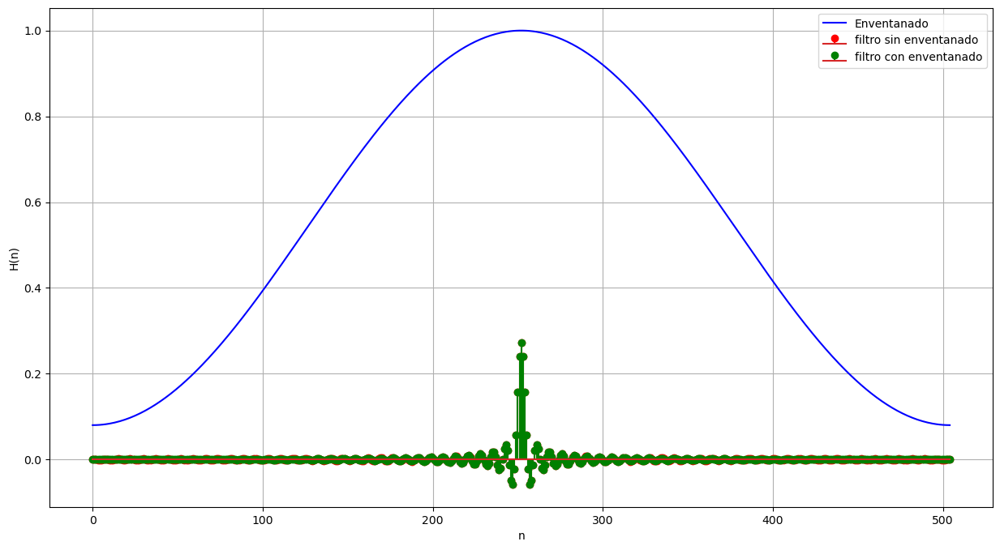

In [57]:
# Grafica
plt.figure(figsize=(15,8))
plt.stem(hi_n,'r',label ='filtro sin enventanado')
plt.plot(wn,'b',label ='Enventanado')
plt.stem(H_n,'g',label='filtro con enventanado')
plt.ylabel('H(n)')
plt.xlabel('n')
plt.legend()
plt.grid()
plt.show()

#### procedemos a realizar el filtrar la señal de audio

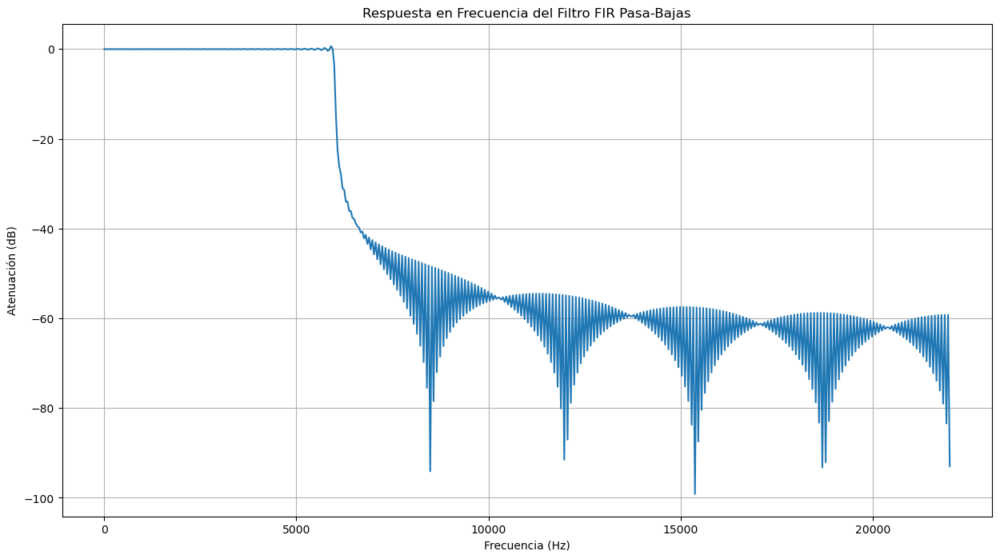

In [58]:
# Diseño del filtro
nyq_rate = fs / 2.0
taps = firwin(M, fc / nyq_rate, window='hamming', width=bwn/fs)

# Aplicar el filtro a la señal (audio_recortado debe ser tu señal de entrada)
filtered_x = lfilter(taps, 1.0, audio_recortado)

# Respuesta en frecuencia del filtro
w, h = freqz(taps, worN=nfft) 

# Gráfica
plt.figure(figsize=(15,8))
plt.plot(0.5 * fs * w / np.pi, 20 * np.log10(np.abs(h)))
plt.title("Respuesta en Frecuencia del Filtro FIR Pasa-Bajas")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Atenuación (dB)")
plt.grid()
plt.show()

#### Se puede aprecioar que el comportamiento del filtro es de un filtro pasa bajas

In [59]:
!pip install soundfile
import soundfile as sf

# Normalizar los datos del audio
filtered_x = filtered_x / np.max(np.abs(filtered_x))

#Guardar el archivo de audio filtrado
output_filename = 'audio_filtrado.wav'

# Convierte la frecuencia de muestreo a un entero
fs_int = int(fs)

# Guarda el archivo de audio filtrado
sf.write(output_filename, filtered_x, fs_int)

#Reproducir el archivo de audio filtrado
display(Audio(output_filename))

#### como se evidencia al oido humano no se puede apreciar algun cambio en el audio de la señal luego de ser filtrado

## * 2do filtro

En este caso realizamos un **Filtro Pasa bandas** con las siguientes especificaciones :
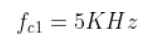
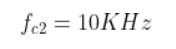
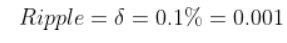

Realizamos los respectivos calculos: 
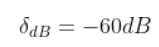
Utilizando la tabla de la **Figura #1** seleccionamos el enventanado **BlackMan** ya que es el unico que acepta los parametros dados
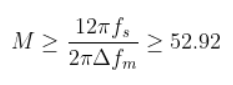
por lo que : 
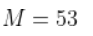
tenemos que: 
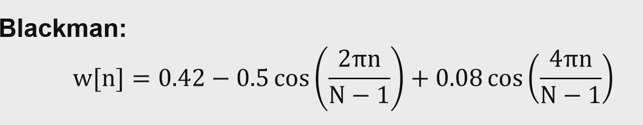
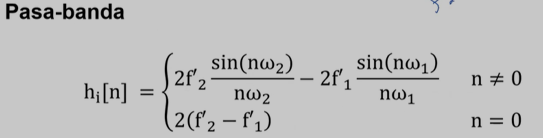

procedemos a realizar la normalizacion de las frecuencias de corte y analisis con las ecuaciones 

In [70]:
#Diseño de filtro pasa Bandas

fs = 44100.0  # frecuencia de muestreo
fc1= 5000.0 #frecuencia de corte #1
fc2= 10000.0 #frecuencia de corte #2
fc1norm= fc1/ fs # frecuencia de corte normalizada #1
fc2norm= fc2/ fs # frecuencia de corte normalizada #2
wc1 = 2*np.pi*(fc1/fs) # frecuencia angular normalizada #1
wc2 = 2*np.pi*(fc2/fs) # frecuencia angular normalizada #2
BW2 = fc2-fc1 #ancho de banda
bwn2=2*np.pi*(BW2/fs) #ancho de banda normalizada
delta2 = 0.001 #ripple
delta_dB2 = -60 #ripple en dB
M2 = 53 #orden del filtro

#vector n del filtro
n2 = np.arange(-M2 // 2 + 1, M2 // 2 + 1)
# Generamos la ecuación del filtro pasa banda
hi_n2 = 2 * fc2norm * (np.sin(wc2 * n2) / (wc2 * n2)) - (2 * fc1norm * (np.sin(wc1 * n2) / (wc1 * n2)))
hi_n2[n2 == 0] = 2 * (fc2norm - fc1norm)

# Generar la ecuación del enventanado
window = np.array([0.42 - 0.5 * np.cos((2 * np.pi * n) / (M2 - 1)) + 0.08 * np.cos((4 * np.pi * n) / (M2 - 1)) for n in range(M2)])


#filtro final enventanado
H_n2 = hi_n2 * window

C:\Users\Usuario\AppData\Local\Temp\ipykernel_2920\4123570812.py:19: RuntimeWarning: invalid value encountered in divide
  hi_n2 = 2 * fc2norm * (np.sin(wc2 * n2) / (wc2 * n2)) - (2 * fc1norm * (np.sin(wc1 * n2) / (wc1 * n2)))


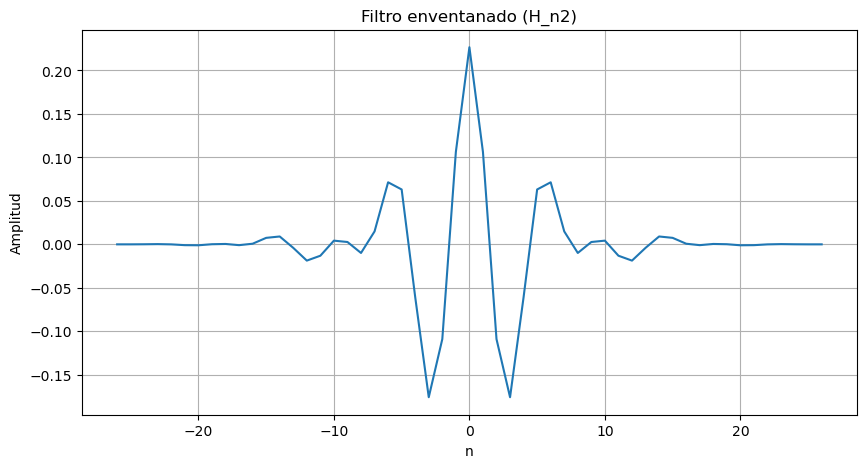

In [71]:
# Graficar el filtro enventanado (H_n2)
plt.figure(figsize=(10, 5))
plt.plot(n2, H_n2)
plt.title('Filtro enventanado (H_n2)')
plt.xlabel('n')
plt.ylabel('Amplitud')
plt.grid()
plt.show()


In [72]:
n2

array([-26, -25, -24, -23, -22, -21, -20, -19, -18, -17, -16, -15, -14,
       -13, -12, -11, -10,  -9,  -8,  -7,  -6,  -5,  -4,  -3,  -2,  -1,
         0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26])

In [73]:
hi_n2

array([-3.52107793e-03, -1.35211615e-04,  1.77579657e-02,  2.21814797e-02,
       -1.54509244e-03, -2.54250254e-02, -1.93048098e-02,  1.82987425e-03,
        4.19219369e-03, -6.55988111e-03,  3.96423267e-03,  3.25358664e-02,
        3.20880696e-02, -1.18748235e-02, -4.64699240e-02, -2.79021760e-02,
        7.92150859e-03,  4.44846633e-03, -1.46659462e-02,  2.00621192e-02,
        8.88022412e-02,  7.34077548e-02, -6.67998621e-02, -1.85619572e-01,
       -1.11633660e-01,  1.06862722e-01,  2.26757370e-01,  1.06862722e-01,
       -1.11633660e-01, -1.85619572e-01, -6.67998621e-02,  7.34077548e-02,
        8.88022412e-02,  2.00621192e-02, -1.46659462e-02,  4.44846633e-03,
        7.92150859e-03, -2.79021760e-02, -4.64699240e-02, -1.18748235e-02,
        3.20880696e-02,  3.25358664e-02,  3.96423267e-03, -6.55988111e-03,
        4.19219369e-03,  1.82987425e-03, -1.93048098e-02, -2.54250254e-02,
       -1.54509244e-03,  2.21814797e-02,  1.77579657e-02, -1.35211615e-04,
       -3.52107793e-03])

In [74]:
H_n2

array([ 4.88647723e-20, -1.78602151e-07,  9.52816673e-05,  2.74445649e-04,
       -3.51001229e-05, -9.37584883e-04, -1.06924632e-03,  1.44186289e-04,
        4.51076837e-04, -9.32770711e-04,  7.24727921e-04,  7.46716634e-03,
        9.05064265e-03, -4.03743998e-03, -1.87084659e-02, -1.30811358e-02,
        4.25718969e-03,  2.69984720e-03, -9.90925161e-03,  1.48844553e-02,
        7.13879715e-02,  6.31204158e-02, -6.06658440e-02, -1.75853937e-01,
       -1.08988768e-01,  1.06224728e-01,  2.26757370e-01,  1.06224728e-01,
       -1.08988768e-01, -1.75853937e-01, -6.06658440e-02,  6.31204158e-02,
        7.13879715e-02,  1.48844553e-02, -9.90925161e-03,  2.69984720e-03,
        4.25718969e-03, -1.30811358e-02, -1.87084659e-02, -4.03743998e-03,
        9.05064265e-03,  7.46716634e-03,  7.24727921e-04, -9.32770711e-04,
        4.51076837e-04,  1.44186289e-04, -1.06924632e-03, -9.37584883e-04,
       -3.51001229e-05,  2.74445649e-04,  9.52816673e-05, -1.78602151e-07,
        4.88647723e-20])

#### procedemos a realizar el filtrado del audio

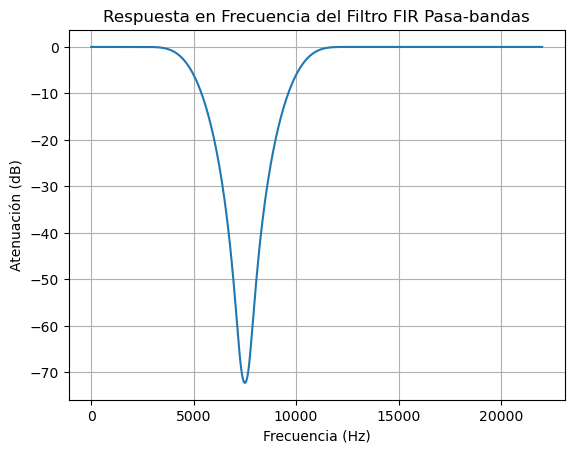

In [75]:
# Diseño del filtro
nyq_rate2 = fs / 2.0
taps2 = firwin(M2, [fc1/nyq_rate2,fc2/nyq_rate2] , window='blackman')

# Aplicar el filtro a la señal (audio_recortado debe ser tu señal de entrada)
filtered_x2 = lfilter(taps2, 1.0, audio_recortado)

# Respuesta en frecuencia del filtro
w2, h2 = freqz(taps2, worN=nfft) 

# Gráfica
plt.figure()
plt.plot(0.5 * fs * w / np.pi, 20 * np.log10(np.abs(h2)))
plt.title("Respuesta en Frecuencia del Filtro FIR Pasa-bandas")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Atenuación (dB)")
plt.grid()
plt.show()

In [76]:
!pip install soundfile
import soundfile as sf

# Normalizar los datos del audio
filtered_x2 = filtered_x2 / np.max(np.abs(filtered_x2))

#Guardar el archivo de audio filtrado
output_filename2 = 'audio_filtrado2.wav'

# Convierte la frecuencia de muestreo a un entero
fs_int2 = int(fs)

# Guarda el archivo de audio filtrado
sf.write(output_filename2, filtered_x2, fs_int2)

#Reproducir el archivo de audio filtrado
display(Audio(output_filename2))

## * 3er filtro

Para el tercer y ultimo filtro vamos a generar otro tipo de filtro que son los **IIR** del cual tiene diferentes tecnicas de desarrollo por lo que escogeremos el de **Invarianza Impulsional**

La creacion de un filtro con la siguiente ecuacion  :
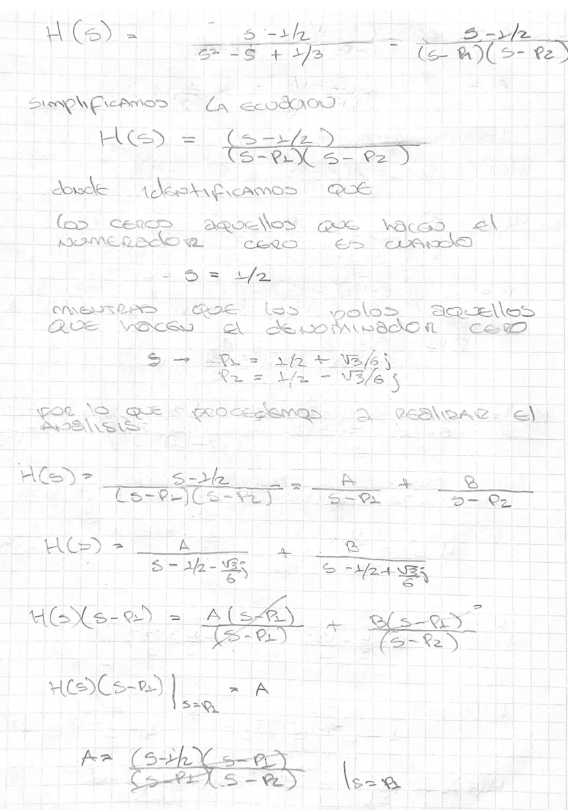
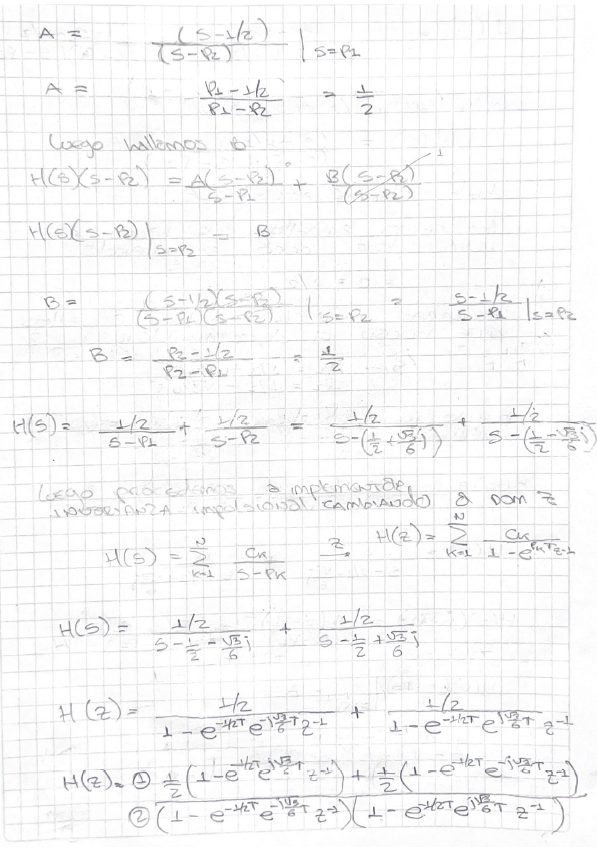
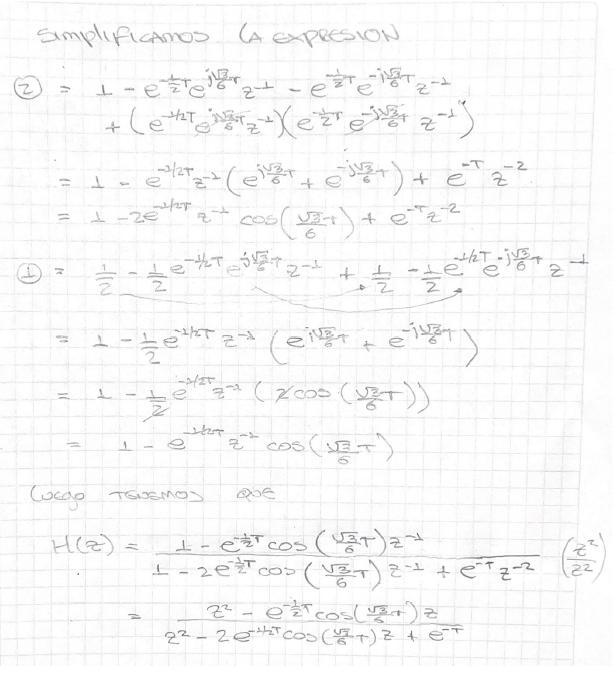

Procedemos a expresar la funcion de transferencia en python para poder realizar el analisis pertinente

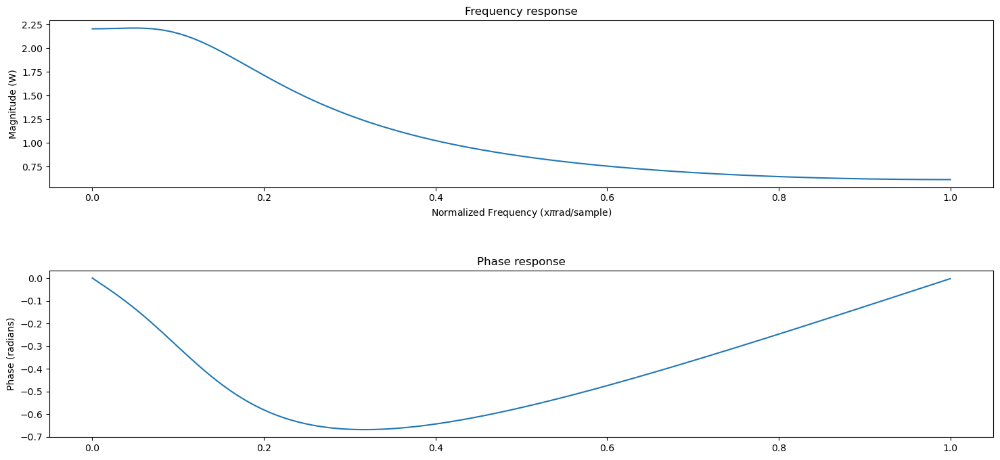

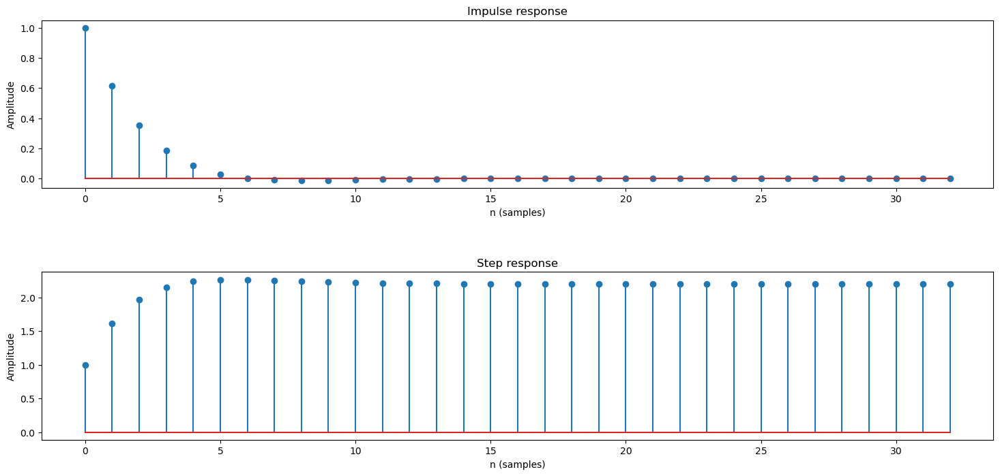

In [77]:
import scipy.signal as sig
from ztrans import *
# Frecuencia de corte
fc = 4500
fcnorm=fc/fs
# Ancho de banda
bw = 2 * fc
wc=2*np.pi*fcnorm
# Coeficiente de amortiguamiento
#zeta = 0.707

# Constante de tiempo
T =0.9

#Hz= (1-(math.exp^(-0.5*T)*cos((math.sqrt(3)/6)*T)*z^(-1)))/(1-(2*math.exp^(-0.5*T)*cos((np.sqrt(3)/6)*T)*z^(-1))+(math.exp^(-T)*Z^(-2)))
a = (math.exp(-0.5*T)*cos((math.sqrt(3)/6)*T))*(-1)
b = 2*a
c= math.exp(-T)
num=[1,a,0]
den=[1,b,c]
Hz=sig.TransferFunction(num, den)
mfreqz(num,den)
impz(num,den)
#zeropoles(num,den)

#### procedemos a realizar el filtrado del audio

## * 4to Filtro

Vamos a implmentar un filtro IIR tipo butterworth

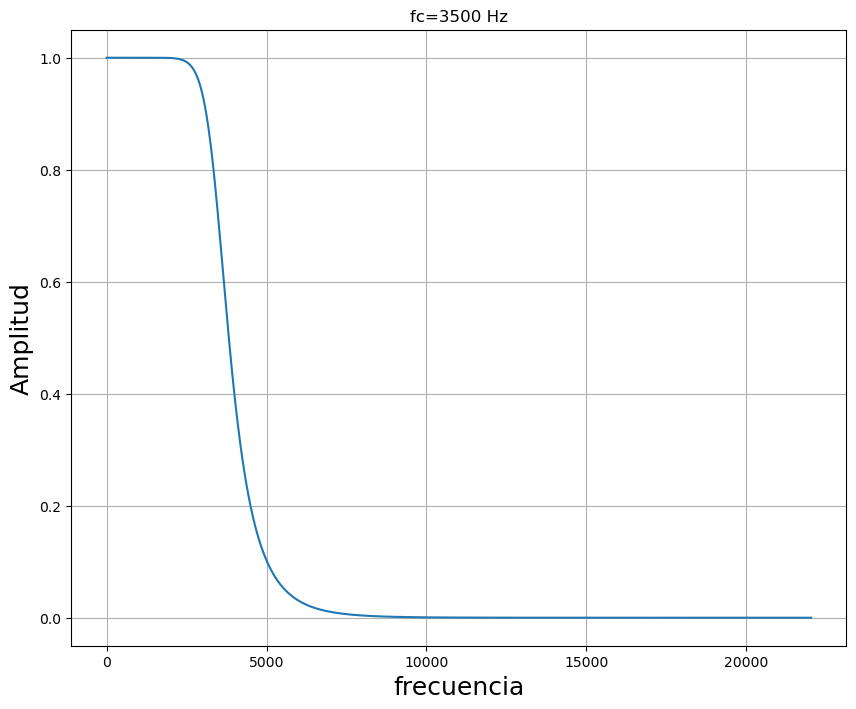

In [78]:
fc_1=3500.0
BW= 200 #ancho de banda
wc_1 = 2*fc_1/fs # frecuencia de corte #1 normalizada
bw_n=2*np.pi*BW/fs

plt.figure(figsize=(10,8))
plt.title('fc=3500 Hz')
plt.ylabel('Amplitud',fontsize=18)
plt.xlabel('frecuencia',fontsize=18)
b1, a1 = sp.butter(6, wc_1)
wb1, Hb1 = sp.freqz(b1, a1, 1024);
plt.plot(wb1/np.pi * (fs/2), np.abs(Hb1))
plt.grid()


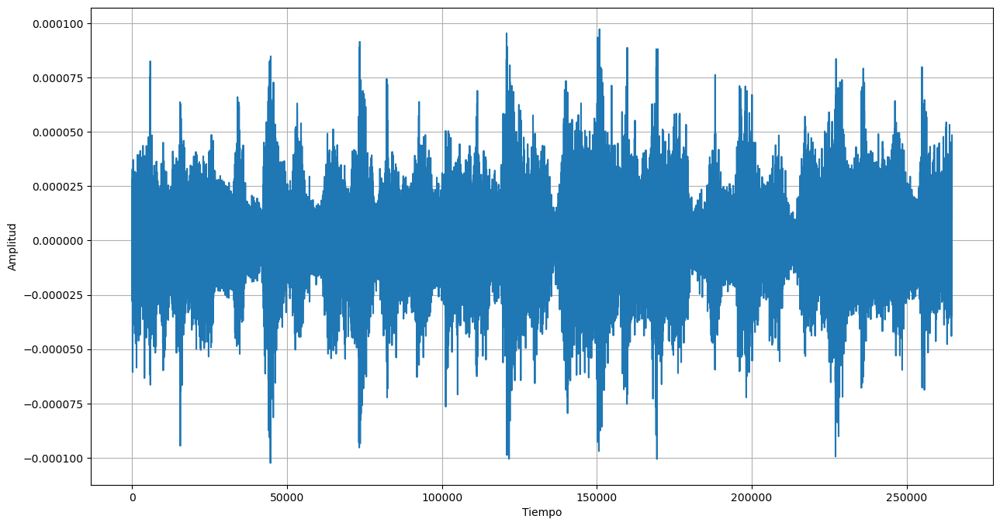

In [82]:
y1 = sp.lfilter(b1, a1,audio_recortado )
plt.figure(figsize=(15,8))
plt.plot(y1)
plt.grid()
plt.ylabel('Amplitud')
plt.xlabel('Tiempo')
plt.show()

In [80]:
!pip install soundfile
import soundfile as sf

# Normalizar los datos del audio
y1 = y1 / np.max(np.abs(y1))

#Guardar el archivo de audio filtrado
output_filename4 = 'audio_filtrado4.wav'

# Convierte la frecuencia de muestreo a un entero
fs_int4 = int(fs)

# Guarda el archivo de audio filtrado
sf.write(output_filename4, y1, fs_int4)

#Reproducir el archivo de audio filtrado
display(Audio(output_filename4))

## Analisis (S.original Vs S.filtrada)

## * 1er Filtro

para detallar de mejor manera el cambio de los valores realizamos la correlacion entre la señal original vs la señal filtrada de la siguiente manera: 

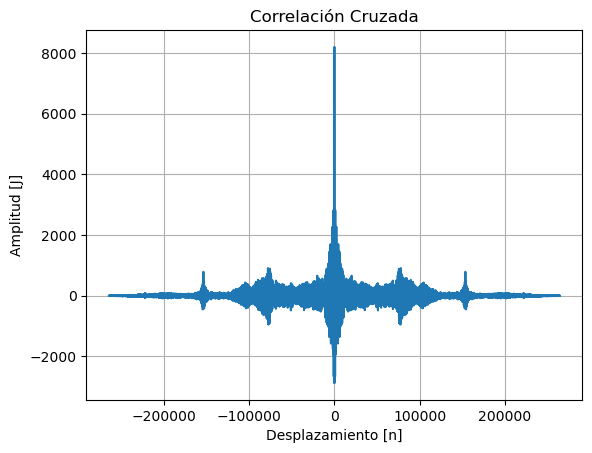

In [67]:
#Rxx = np.correlate(audio_recortado, filtered_x, mode='full')
# Realizar la correlación cruzada
Rxx = np.correlate(audio_recortado.ravel(), filtered_x.ravel(), mode='full') #full es para que grafique cuando empiezan y terminas solapandose las señales
tau = np.arange(-len(audio_recortado)+1, len(audio_recortado), 1)

# Graficar la correlación
plt.plot(tau, Rxx)
plt.title("Correlación Cruzada")
plt.xlabel("Desplazamiento [n]")
plt.ylabel("Amplitud [J]")
plt.grid()
plt.show()

In [68]:
corr = np.corrcoef(audio_recortado,filtered_x)[0,1]
print(corr)

C:\Users\Usuario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2846: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)


MemoryError: Unable to allocate 2.04 TiB for an array with shape (529200, 529200) and data type float64

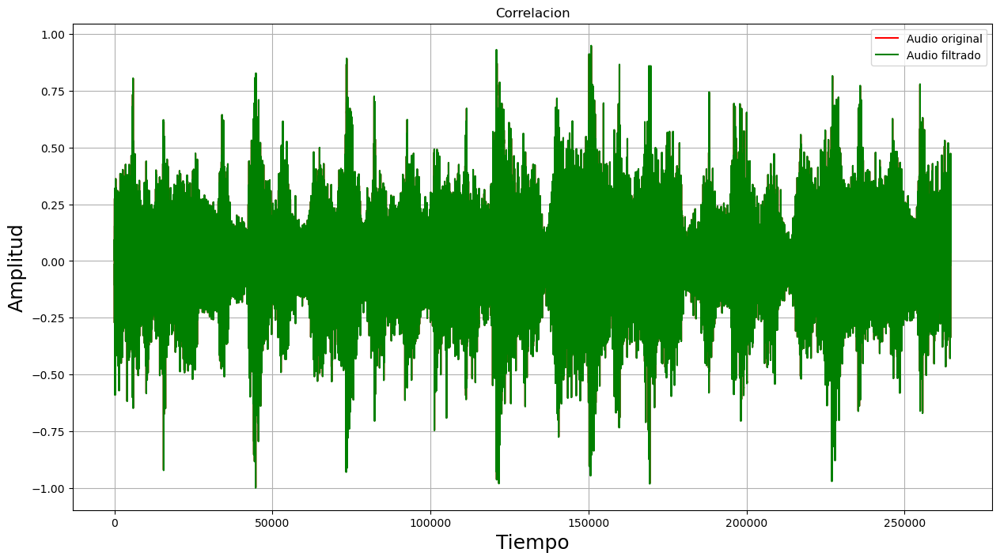

In [69]:
plt.figure(figsize=(15, 8))
plt.plot(audio_recortado,'r',label='Audio original')
plt.plot(filtered_x,'g',label='Audio filtrado')
plt.title('Correlacion')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.grid()
plt.legend()
plt.show()

## * 2do Filtro

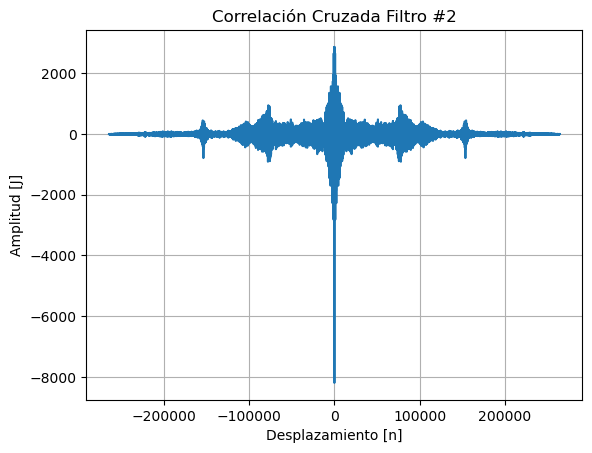

In [84]:
# Realizar la correlación cruzada
Rxx2 = np.correlate(audio_recortado.ravel(), filtered_x2.ravel(), mode='full')
tau2 = np.arange(-len(audio_recortado)+1, len(audio_recortado), 1)

# Graficar la correlación
plt.plot(tau2, Rxx2)
plt.title("Correlación Cruzada Filtro #2")
plt.xlabel("Desplazamiento [n]")
plt.ylabel("Amplitud [J]")
plt.grid()
plt.show()

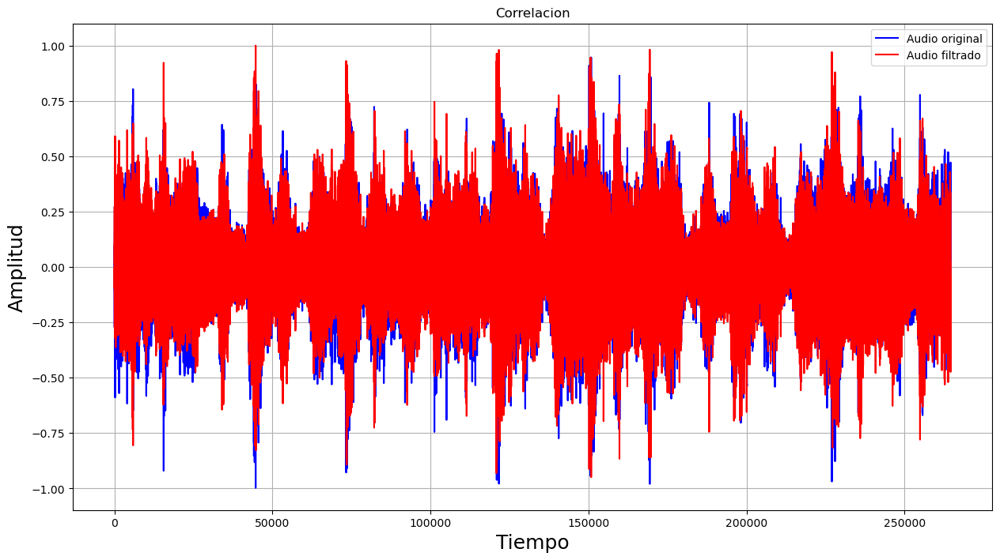

In [85]:
plt.figure(figsize=(15, 8))
plt.plot(audio_recortado,'b',label='Audio original')
plt.plot(filtered_x2,'r',label='Audio filtrado')
plt.title('Correlacion')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.grid()
plt.legend()
plt.show()

## * 3er Filtro

## * 4to Filtro

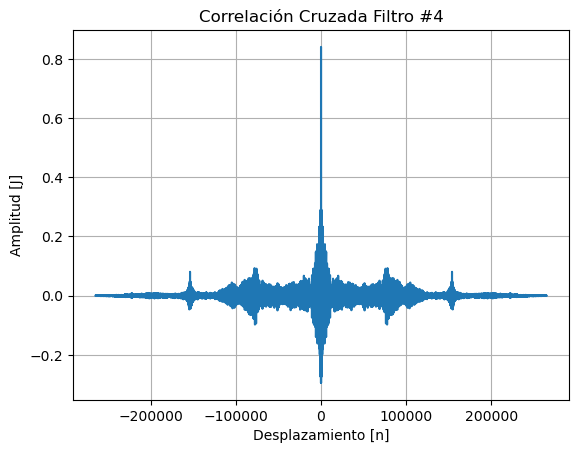

In [86]:
# Realizar la correlación cruzada
Rxx3 = np.correlate(audio_recortado.ravel(), y1.ravel(), mode='full')
tau3 = np.arange(-len(audio_recortado)+1, len(audio_recortado), 1)

# Graficar la correlación
plt.plot(tau3, Rxx3)
plt.title("Correlación Cruzada Filtro #4")
plt.xlabel("Desplazamiento [n]")
plt.ylabel("Amplitud [J]")
plt.grid()
plt.show()

## Funciones de Python para filtros

## * 1er Filtro

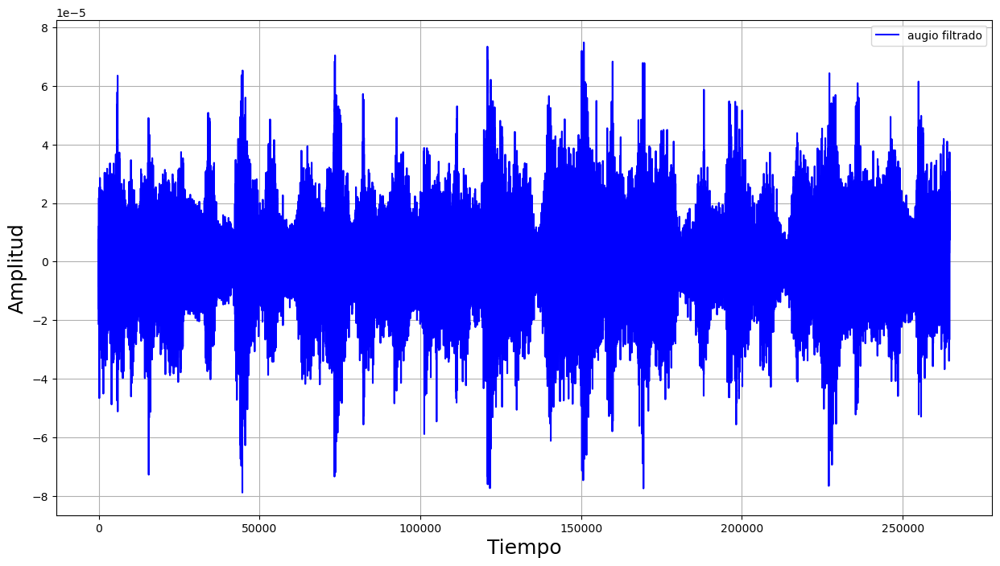

In [87]:
cutoff_freq = 6000  # Frecuencia de corte
cutoff_freq_norm = cutoff_freq / fs  # Frecuencia de corte normalizada

filter_order = 505
# Diseña el coeficiente del filtro FIR
filter_coeffs = signal.firwin(filter_order, cutoff_freq_norm)
# Aplica el filtro FIR al audio
filtered_audio = signal.lfilter(filter_coeffs, 1, audio_recortado)
plt.figure(figsize=(15, 8))
plt.plot(filtered_audio,'b',label='augio filtrado')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.grid()
plt.legend()
plt.show()

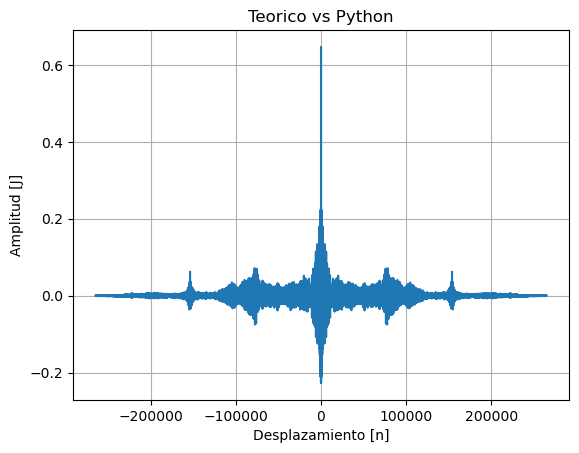

In [88]:
Rxx5 = np.correlate(audio_recortado.ravel(), filtered_audio.ravel(), mode='full') #full es para que grafique cuando empiezan y terminas solapandose las señales
tau5 = np.arange(-len(audio_recortado)+1, len(audio_recortado), 1)

# Graficar la correlación
plt.plot(tau5, Rxx5)
plt.title("Teorico vs Python")
plt.xlabel("Desplazamiento [n]")
plt.ylabel("Amplitud [J]")
plt.grid()
plt.show()

#### se muestra que la diferencia de amplitud entre la señales no supera el 1.6, por lo que se puede intuir que el filtrado de la señal con uso de las funciones de python son mas precisas

## *2do FIltro

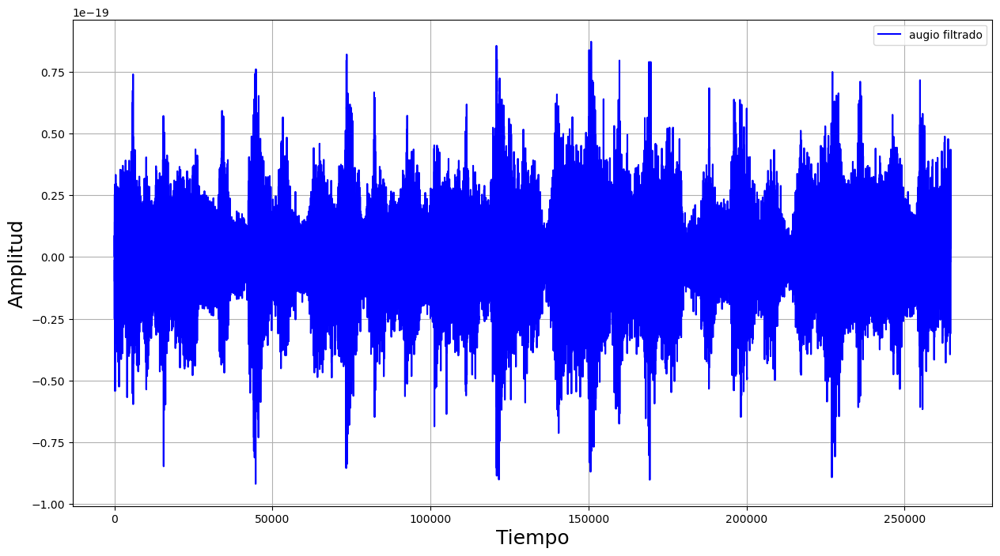

In [89]:
import numpy as np
import scipy.signal as sig
import soundfile as sf

# Parámetros del filtro
fc1 = 5000
fc2 = 10000
fs = 44100
orden = 53

# Genera los coeficientes del filtro
coeficientes = sig.firwin(orden, [fc1/fs, fc2/fs], window='blackman',pass_zero='bandpass')

# Aplica el filtro FIR
senal_filtrada = sig.lfilter(coeficientes, 1, audio_recortado)
# Carga la señal de audio
senal_audio, tasa_muestreo = sf.read('audio.wav')

# Guarda la señal de audio filtrada
sf.write('audio_filtrado.wav', senal_filtrada, tasa_muestreo)

plt.figure(figsize=(15, 8))
plt.plot(senal_filtrada,'b',label='augio filtrado')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.grid()
plt.legend()
plt.show()

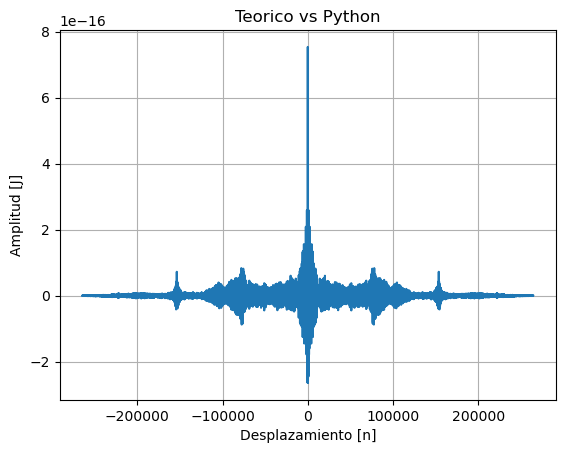

In [90]:
Rxx6 = np.correlate(audio_recortado.ravel(), senal_filtrada.ravel(), mode='full') #full es para que grafique cuando empiezan y terminas solapandose las señales
tau6 = np.arange(-len(audio_recortado)+1, len(audio_recortado), 1)

# Graficar la correlación
plt.plot(tau6, Rxx6)
plt.title("Teorico vs Python")
plt.xlabel("Desplazamiento [n]")
plt.ylabel("Amplitud [J]")
plt.grid()
plt.show()

In [ ]:
#### la escala sugiere